# ResNet50 + LSTM

## Import Library

In [2]:
import numpy as np
import json
import os
import os.path
import pickle
from collections import Counter, defaultdict

from PIL import Image
from tqdm import tqdm
from pycocotools.coco import COCO

import torch
import torch.nn as nn
import torchvision.models as models
import torch.utils.data as data

from torchvision import transforms
from nltk.translate.bleu_score import corpus_bleu

import nltk
import matplotlib.pyplot as plt

In [3]:
nltk.download("punkt")
nltk.download("punkt_tab")

[nltk_data] Downloading package punkt to /usr/share/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt_tab to /usr/share/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.


True

## Define Class & Function

In [4]:
# Vocabulary

class Vocabulary(object):
    def __init__(
        self,
        vocab_threshold,
        vocab_file="/kaggle/input/resnet-lstm-result/vocab.pkl",
        start_word="<start>",
        end_word="<end>",
        unk_word="<unk>",
        annotations_file="/kaggle/input/coco-2017-dataset/coco2017/annotations/captions_train2017.json",
        vocab_from_file=False,
    ):
        self.vocab_threshold = vocab_threshold
        self.vocab_file = vocab_file
        self.start_word = start_word
        self.end_word = end_word
        self.unk_word = unk_word
        self.annotations_file = annotations_file
        self.vocab_from_file = vocab_from_file
        self.get_vocab()

    def get_vocab(self):
        if os.path.exists(self.vocab_file) and self.vocab_from_file:
            with open(self.vocab_file, "rb") as f:
                vocab = pickle.load(f)
            self.word2idx = vocab.word2idx
            self.idx2word = vocab.idx2word

        else:
            self.build_vocab()
            with open(self.vocab_file, "wb") as f:
                pickle.dump(self, f)

    def build_vocab(self):
        self.init_vocab()
        self.add_word(self.start_word)
        self.add_word(self.end_word)
        self.add_word(self.unk_word)
        self.add_captions()

    def init_vocab(self):
        self.word2idx = {}
        self.idx2word = {}
        self.idx = 0

    def add_word(self, word):
        if word not in self.word2idx:
            self.word2idx[word] = self.idx
            self.idx2word[self.idx] = word
            self.idx += 1

    def add_captions(self):
        coco = COCO(self.annotations_file)
        counter = Counter()
        ids = coco.anns.keys()
        for i, idx in enumerate(ids):
            caption = str(coco.anns[idx]["caption"])
            tokens = nltk.tokenize.word_tokenize(caption.lower())
            counter.update(tokens)

        words = [word for word, cnt in counter.items() if cnt >= self.vocab_threshold]

        for i, word in enumerate(words):
            self.add_word(word)

    def __call__(self, word):
        if word not in self.word2idx:
            return self.word2idx[self.unk_word]
        return self.word2idx[word]

    def __len__(self):
        return len(self.word2idx)

In [5]:
# Coco Dataset

class CoCoDataset(data.Dataset):
    def __init__(
        self,
        transform,
        mode,
        batch_size,
        vocab_threshold,
        vocab_file,
        start_word,
        end_word,
        unk_word,
        annotations_file,
        vocab_from_file,
        img_folder,
    ):
        self.transform = transform
        self.mode = mode
        self.batch_size = batch_size
        self.img_folder = img_folder
        self.vocab = Vocabulary(
            vocab_threshold,
            vocab_file,
            start_word,
            end_word,
            unk_word,
            annotations_file,
            vocab_from_file,
        )
        if self.mode == "train":
            self.coco = COCO(annotations_file)
            self.ids = list(self.coco.anns.keys())

            tokenized_captions = [
                nltk.tokenize.word_tokenize(
                    str(self.coco.anns[self.ids[index]]["caption"]).lower()
                )
                for index in tqdm(np.arange(len(self.ids)))
            ]

            self.caption_lengths = [len(token) for token in tokenized_captions]
        else:
            test_info = json.loads(open(annotations_file).read())
            self.paths = [item["file_name"] for item in test_info["images"]]

    def __getitem__(self, index):
        if self.mode == "train":
            ann_id = self.ids[index]
            caption = self.coco.anns[ann_id]["caption"]
            img_id = self.coco.anns[ann_id]["image_id"]
            path = self.coco.loadImgs(img_id)[0]["file_name"]

            image = Image.open(os.path.join(self.img_folder, path)).convert("RGB")
            image = self.transform(image)

            tokens = nltk.tokenize.word_tokenize(str(caption).lower())
            caption = [self.vocab(self.vocab.start_word)]
            caption.extend([self.vocab(token) for token in tokens])
            caption.append(self.vocab(self.vocab.end_word))
            caption = torch.Tensor(caption).long()

            return image, caption

        else:
            path = self.paths[index]

            pil_image = Image.open(os.path.join(self.img_folder, path)).convert("RGB")
            orig_image = np.array(pil_image)
            image = self.transform(pil_image)

            return orig_image, image

    def get_train_indices(self):
        sel_length = np.random.choice(self.caption_lengths)
        all_indices = np.where(
            [
                self.caption_lengths[i] == sel_length
                for i in np.arange(len(self.caption_lengths))
            ]
        )[0]
        indices = list(np.random.choice(all_indices, size=self.batch_size))
        return indices

    def __len__(self):
        if self.mode == "train":
            return len(self.ids)
        else:
            return len(self.paths)

In [6]:
# Get Loader

def get_loader(
    transform,
    mode="train",
    batch_size=1,
    vocab_threshold=None,
    vocab_file="/kaggle/input/resnet-lstm-result/vocab.pkl",
    start_word="<start>",
    end_word="<end>",
    unk_word="<unk>",
    vocab_from_file=True,
    num_workers=4,
    pin_memory = True,
    cocoapi_loc="/opt",
):

    if mode == "train":
        if vocab_from_file:
        img_folder = "/kaggle/input/coco-2017-dataset/coco2017/train2017"
        annotations_file = "/kaggle/input/coco-2017-dataset/coco2017/annotations/captions_train2017.json"

    elif mode == "test":
        img_folder = "/kaggle/input/test-data/test2017/test2017"
        annotations_file = "/kaggle/input/test-data/image_info_test2017.json"
    else:
        raise ValueError(f"Invalid mode: {mode}")

    dataset = CoCoDataset(
        transform=transform,
        mode=mode,
        batch_size=batch_size,
        vocab_threshold=vocab_threshold,
        vocab_file=vocab_file,
        start_word=start_word,
        end_word=end_word,
        unk_word=unk_word,
        annotations_file=annotations_file,
        vocab_from_file=vocab_from_file,
        img_folder=img_folder,
    )

    if mode == "train":
        indices = dataset.get_train_indices()

        initial_sampler = data.sampler.SubsetRandomSampler(indices=indices)

        data_loader = data.DataLoader(
            dataset=dataset,
            num_workers=num_workers,
            pin_memory=pin_memory,
            batch_sampler=data.sampler.BatchSampler(
                sampler=initial_sampler, batch_size=dataset.batch_size, drop_last=False
            ),
        )
    else:
        data_loader = data.DataLoader(
            dataset=dataset,
            batch_size=dataset.batch_size,
            shuffle=True,
            num_workers=num_workers,
        )

    return data_loader

In [8]:
# val_loader

def val_get_loader(
    transform,
    mode="valid",
    batch_size=1,
    vocab_threshold=None,
    vocab_file="/kaggle/input/resnet-lstm-result/vocab.pkl",
    start_word="<start>",
    end_word="<end>",
    unk_word="<unk>",
    vocab_from_file=True,
    num_workers=4,
    pin_memory=True,
    cocoapi_loc="/opt",
):

    if mode == "train":
        img_folder = "/kaggle/input/coco-2017-dataset/coco2017/train2017"
        annotations_file = "/kaggle/input/coco-2017-dataset/coco2017/annotations/captions_train2017.json"
        
    elif mode == "test":
        img_folder = "/kaggle/input/test-data/test2017/test2017"
        annotations_file = "/kaggle/input/test-data/image_info_test2017.json"
        
    elif mode == "valid":
        img_folder = "/kaggle/input/coco-2017-dataset/coco2017/val2017"
        annotations_file = "/kaggle/input/coco-2017-dataset/coco2017/annotations/captions_val2017.json"
    else:
        raise ValueError(f"Invalid mode: {mode}")
        
    dataset = CoCoDataset(
        transform=transform,
        mode=mode,
        batch_size=batch_size,
        vocab_threshold=vocab_threshold,
        vocab_file=vocab_file,
        start_word=start_word,
        end_word=end_word,
        unk_word=unk_word,
        annotations_file=annotations_file,
        vocab_from_file=vocab_from_file,
        img_folder=img_folder,
    )

    if mode == "train":
        indices = dataset.get_train_indices()
        initial_sampler = data.sampler.SubsetRandomSampler(indices=indices)

        data_loader = data.DataLoader(
            dataset=dataset,
            num_workers=num_workers,
            pin_memory=pin_memory,
            batch_sampler=data.sampler.BatchSampler(
                sampler=initial_sampler, batch_size=dataset.batch_size, drop_last=False
            ),
        )
    else:
        data_loader = data.DataLoader(
            dataset=dataset,
            batch_size=dataset.batch_size,
            shuffle=True,
            num_workers=num_workers,
        )

    return data_loader

In [9]:
# Convert back sentence

def clean_sentence(output, idx2word):
    sentence = ""
    for i in output:
        word = idx2word[i]
        if i == 0:
            continue
        if i == 1:
            break
        if i == 18:
            sentence = sentence + word
        else:
            sentence = sentence + " " + word
    return sentence

In [ ]:
# Eval using BLEU

def bleu_score(true_sentences, predicted_sentences):
    hypotheses = []
    references = []
    for img_id in set(true_sentences.keys()).intersection(
        set(predicted_sentences.keys())
    ):
        img_refs = [cap.split() for cap in true_sentences[img_id]]
        references.append(img_refs)
        hypotheses.append(predicted_sentences[img_id][0].strip().split())

    return corpus_bleu(references, hypotheses)

In [ ]:
# pip install git+https://github.com/salaniz/pycocoevalcap.git

In [13]:
# METEOR

from pycocoevalcap.meteor.meteor import Meteor

def meteor_score_eval(true_sentences, predicted_sentences):
    meteor_scorer = Meteor()
    # Format data for pycocoevalcap
    gts = {img_id: [" ".join(caps) for caps in true_sentences[img_id]] for img_id in true_sentences}
    res = {img_id: [" ".join(predicted_sentences[img_id])] for img_id in predicted_sentences}
    meteor_score, _ = meteor_scorer.compute_score(gts, res)
    return meteor_score



In [14]:
# ROUGE

from rouge_score import rouge_scorer

def rouge_score_eval(true_sentences, predicted_sentences):
    scorer = rouge_scorer.RougeScorer(['rouge1', 'rouge2', 'rougeL'], use_stemmer=True)
    scores = []
    for img_id in set(true_sentences.keys()).intersection(set(predicted_sentences.keys())):
        img_refs = " ".join(true_sentences[img_id])  # Combine references into one string
        hypothesis = predicted_sentences[img_id][0]
        score = scorer.score(img_refs, hypothesis)
        scores.append(score['rougeL'].fmeasure)  # Use ROUGE-L F-measure
    return sum(scores) / len(scores)


In [15]:
# CIDEr

from pycocoevalcap.cider.cider import Cider

def cider_score_eval(true_sentences, predicted_sentences):
    cider_scorer = Cider()
    # Format data for pycocoevalcap
    gts = {img_id: [" ".join(caps) for caps in true_sentences[img_id]] for img_id in true_sentences}
    res = {img_id: [" ".join(predicted_sentences[img_id])] for img_id in predicted_sentences}
    cider_score, _ = cider_scorer.compute_score(gts, res)
    return cider_score


In [16]:
# SPICE

from pycocoevalcap.spice.spice import Spice

def spice_score_eval(true_sentences, predicted_sentences):
    spice_scorer = Spice()
    # Format data for pycocoevalcap
    gts = {img_id: [" ".join(caps) for caps in true_sentences[img_id]] for img_id in true_sentences}
    res = {img_id: [" ".join(predicted_sentences[img_id])] for img_id in predicted_sentences}
    spice_score, _ = spice_scorer.compute_score(gts, res)
    return spice_score


In [17]:
# BERTScore

from bert_score import score

def bert_score_eval(true_sentences, predicted_sentences):
    hypotheses = [predicted_sentences[img_id][0] for img_id in predicted_sentences]
    references = [" ".join(true_sentences[img_id]) for img_id in predicted_sentences]
    _, _, bert_scores = score(hypotheses, references, lang="en", rescale_with_baseline=True)
    return bert_scores.mean().item()


## ResNet + LSTM Architecture

In [18]:
import torch
import torch.nn as nn
import torchvision.models as models


# Encoder: ResNet50
class EncoderCNN(nn.Module):
    def __init__(self, embed_size):
        super(EncoderCNN, self).__init__()
        resnet = models.resnet50(pretrained=True)

        for param in resnet.parameters():
            param.requires_grad_(False)

        modules = list(resnet.children())[:-1]
        self.resnet = nn.Sequential(*modules)
        self.embed = nn.Linear(resnet.fc.in_features, embed_size)

    def forward(self, images):
        features = self.resnet(images)
        features = features.view(features.size(0), -1)
        features = self.embed(features)
        return features


# Decoder: LSTM
class DecoderRNN(nn.Module):
    def __init__(self, embed_size, hidden_size, vocab_size, num_layers=1):
        super(DecoderRNN, self).__init__()

        self.hidden_dim = hidden_size
        self.embed = nn.Embedding(vocab_size, embed_size)
        self.lstm = nn.LSTM(embed_size, hidden_size, num_layers, batch_first=True)
        self.linear = nn.Linear(hidden_size, vocab_size)
        self.hidden = (torch.zeros(1, 1, hidden_size), torch.zeros(1, 1, hidden_size))

    def forward(self, features, captions):

        cap_embedding = self.embed(
            captions[:, :-1]
        )


        embeddings = torch.cat((features.unsqueeze(dim=1), cap_embedding), dim=1)

        lstm_out, self.hidden = self.lstm(
            embeddings
        )
        outputs = self.linear(lstm_out)

        return outputs

    def sample(self, inputs, states=None, max_len=20):

        res = []

        for i in range(max_len):
            lstm_out, states = self.lstm(
                inputs, states
            )
            outputs = self.linear(lstm_out.squeeze(dim=1))
            _, predicted_idx = outputs.max(dim=1)
            res.append(predicted_idx.item())

            if predicted_idx == 1:
                break
            inputs = self.embed(predicted_idx)

            inputs = inputs.unsqueeze(1)

        return res

In [19]:
# Path to coco dataset

cocoapi_dir = '/kaggle/input/coco-2017-dataset/coco2017'

In [20]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


In [21]:
# Setting hyperparameters

batch_size = 128
vocab_threshold = 5
vocab_from_file = True
embed_size = 256
hidden_size = 512
num_epochs = 3
save_every = 1
print_every = 500
log_file = "training_log.txt"

# Transform
transform_train = transforms.Compose(
    [
        transforms.Resize(256),
        transforms.RandomCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize(
            (0.485, 0.456, 0.406),
            (0.229, 0.224, 0.225),
        ),
    ]
)

In [16]:
# data_loader = get_loader(
#     transform=transform_train,
#     mode="train",
#     batch_size=batch_size,
#     vocab_threshold=vocab_threshold,
#     vocab_from_file=False,
#     cocoapi_loc=cocoapi_dir,
# )

In [22]:
# Set train loader

data_loader = get_loader(
    transform=transform_train,
    mode="train",
    batch_size=batch_size,
    vocab_threshold=vocab_threshold,
    vocab_from_file=vocab_from_file,
    cocoapi_loc=cocoapi_dir,
)

Vocabulary successfully loaded from vocab.pkl file!
loading annotations into memory...
Done (t=1.73s)
creating index...
index created!
Obtaining caption lengths...


100%|██████████| 591753/591753 [00:54<00:00, 10926.28it/s]


In [23]:
vocab_size = len(data_loader.dataset.vocab)
print(vocab_size)

10330


In [24]:
# Setting up model

vocab_size = len(data_loader.dataset.vocab)

encoder = EncoderCNN(embed_size)
decoder = DecoderRNN(embed_size, hidden_size, vocab_size)

encoder.to(device)
decoder.to(device)

criterion = (
    nn.CrossEntropyLoss().cuda() if torch.cuda.is_available() else nn.CrossEntropyLoss()
)

params = list(decoder.parameters()) + list(encoder.embed.parameters())

optimizer = torch.optim.Adam(params, lr=0.0001)

import math
total_step = math.ceil(len(data_loader.dataset) / data_loader.batch_sampler.batch_size)

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 186MB/s] 


In [20]:
# Save path

model_save_path = '/kaggle/working/output/save_path'
# os.makedirs(model_save_path, exist_ok=True)

In [ ]:
# Load pre-trained weights before resuming training

encoder.load_state_dict(torch.load("/kaggle/input/resnet-lstm-result/encoder-final.pkl"))
decoder.load_state_dict(torch.load("/kaggle/input/resnet-lstm-result/decoder-final.pkl"))

In [ ]:
# Train Loop

for epoch in range(1, num_epochs + 1):
    for i_step in range(1, total_step + 1):

        indices = data_loader.dataset.get_train_indices()

        new_sampler = data.sampler.SubsetRandomSampler(indices=indices)
        data_loader.batch_sampler.sampler = new_sampler

        images, captions = next(iter(data_loader))

        images = images.to(device)
        captions = captions.to(device)

        decoder.zero_grad()
        encoder.zero_grad()

        features = encoder(images)
        outputs = decoder(features, captions)

        loss = criterion(outputs.view(-1, vocab_size), captions.view(-1))

        loss.backward()

        optimizer.step()

        stats = (
            f"Epoch [{epoch}/{num_epochs}], Step [{i_step}/{total_step}], "
            f"Loss: {loss.item():.4f}, Perplexity: {np.exp(loss.item()):.4f}"
        )

        if i_step % print_every == 0:
            print("\r" + stats)

    if epoch % save_every == 0:
        torch.save(
            decoder.state_dict(), f"./decoder-{epoch}.pkl"
        )
        torch.save(
            encoder.state_dict(), f"./encoder-{epoch}.pkl"
        )


In [ ]:
# torch.save(decoder.state_dict(), 'decoder-final.pkl')
# torch.save(encoder.state_dict(), 'encoder-final.pkl')

In [ ]:
# Validation set up

transform_test = transforms.Compose(
    [
        transforms.Resize(224),
        transforms.ToTensor(),
        transforms.Normalize(
            (0.485, 0.456, 0.406),  # normalize image for pre-trained model
            (0.229, 0.224, 0.225),
        ),
    ]
)


val_data_loader = val_get_loader(
    transform=transform_test, mode="valid", cocoapi_loc=cocoapi_dir
)

encoder_file = "/kaggle/input/resnet-lstm-result/encoder-final.pkl"
decoder_file = "/kaggle/input/resnet-lstm-result/decoder-final.pkl"

encoder = EncoderCNN(embed_size)
decoder = DecoderRNN(embed_size, hidden_size, vocab_size)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
encoder.to(device)
decoder.to(device)

encoder.load_state_dict(torch.load(encoder_file))
decoder.load_state_dict(torch.load(decoder_file))

encoder.eval()
decoder.eval()

In [26]:
# Call all caption from val

pred_result = defaultdict(list)
for img_id, img in tqdm(val_data_loader):
    img = img.to(device)
    with torch.no_grad():
        features = encoder(img)
        features = features.unsqueeze(0).permute(1, 0, 2)
        output = decoder.sample(features)
    sentence = clean_sentence(output, val_data_loader.dataset.vocab.idx2word)
    pred_result[img_id.item()].append(sentence)

100%|██████████| 5000/5000 [01:23<00:00, 59.83it/s]


In [ ]:
print(output)

In [27]:
# Validation result

with open(
    os.path.join(cocoapi_dir, "annotations/captions_val2017.json"), "r"
) as f:
    caption = json.load(f)

valid_annot = caption["annotations"]
valid_result = defaultdict(list)
for i in valid_annot:
    valid_result[i["image_id"]].append(i["caption"].lower())

In [28]:
list(valid_result.values())[:3]

[['a black honda motorcycle parked in front of a garage.',
  'a honda motorcycle parked in a grass driveway',
  'a black honda motorcycle with a dark burgundy seat.',
  'ma motorcycle parked on the gravel in front of a garage',
  'a motorcycle with its brake extended standing outside'],
 ['an office cubicle with four different types of computers.',
  'the home office space seems to be very cluttered.',
  'an office with desk computer and chair and laptop.',
  'office setting with a lot of computer screens.',
  'a desk and chair in an office cubicle.'],
 ['a small closed toilet in a cramped space.',
  'a tan toilet and sink combination in a small room.',
  'this is an advanced toilet with a sink and control panel.',
  'a close-up picture of a toilet with a fountain.',
  'off white toilet with a faucet and controls. ']]

In [29]:
list(pred_result.values())[:3]

[[' a woman holding a red umbrella in the rain .'],
 [' a group of people standing around a table with a large pizza .'],
 [' a man is standing in the grass with a skateboard .']]

In [21]:
# Measure BLEU Score

bleu_score(true_sentences=valid_result, predicted_sentences=pred_result)

0.16457489718819512

In [33]:
# Evaluation

true_sentences=valid_result
predicted_sentences=pred_result

# Evaluation method
print("BLEU:", bleu_score(true_sentences, predicted_sentences))
print("ROUGE:", rouge_score_eval(true_sentences, predicted_sentences))
print("CIDEr:", cider_score_eval(true_sentences, predicted_sentences))

BLEU: 0.16457489718819512
ROUGE: 0.196221700274235
CIDEr: 7.87449479846744e-08


tokenizer_config.json:   0%|          | 0.00/25.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/482 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/899k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

Exception ignored in: <function Meteor.__del__ at 0x79d3b169f760>
Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/site-packages/pycocoevalcap/meteor/meteor.py", line 78, in __del__
    self.lock.acquire()
KeyboardInterrupt: 


model.safetensors:   0%|          | 0.00/1.42G [00:00<?, ?B/s]

Some weights of RobertaModel were not initialized from the model checkpoint at roberta-large and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


BERTScore: 0.25770312547683716


## Test Model

In [27]:
# Test data loader

data_loader = get_loader(transform=transform_test, mode="test", cocoapi_loc=cocoapi_dir)

Vocabulary successfully loaded from vocab.pkl file!


In [28]:
# Get prediction

def get_prediction(idx2word, i=0, save=False):
    orig_image, image = next(iter(data_loader))
    image = image.to(device)
    features = encoder(image).unsqueeze(1)
    output = decoder.sample(features)
    sentence = clean_sentence(output, idx2word)

    ax = plt.axes()

    ax.spines["right"].set_visible(False)
    ax.spines["top"].set_visible(False)
    ax.spines["bottom"].set_visible(False)
    ax.spines["left"].set_visible(False)

    ax.xaxis.set_major_locator(plt.NullLocator())
    ax.yaxis.set_major_locator(plt.NullLocator())

    plt.imshow(np.squeeze(orig_image))
    plt.xlabel(sentence, fontsize=12)
    if save:
        plt.savefig(f"samples/sample_{i:03}.png", bbox_inches="tight")
    plt.show()

## Model Prediction

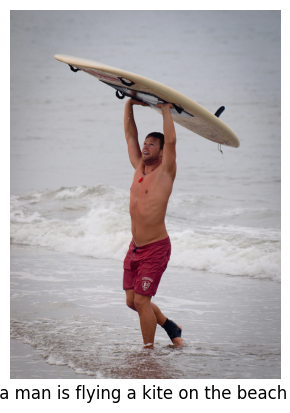

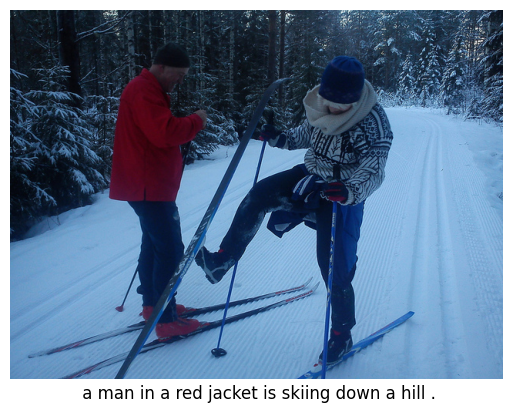

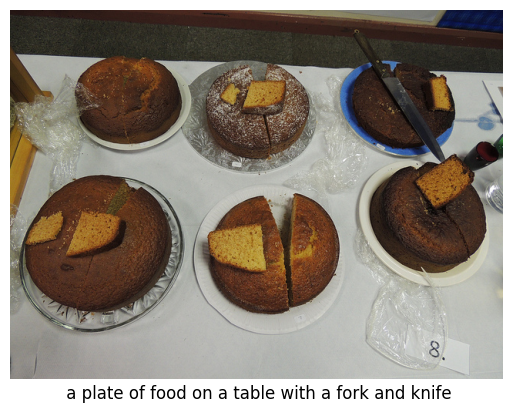

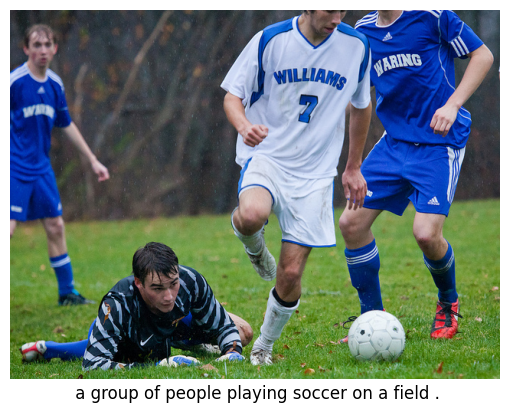

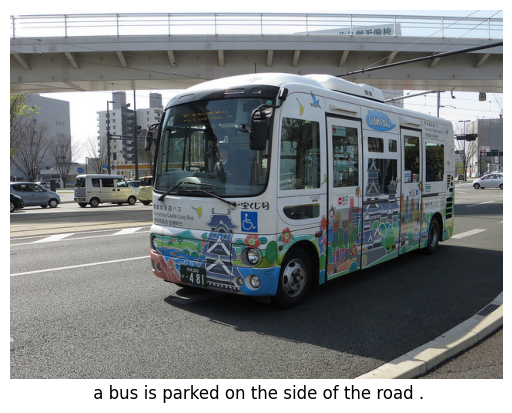

...

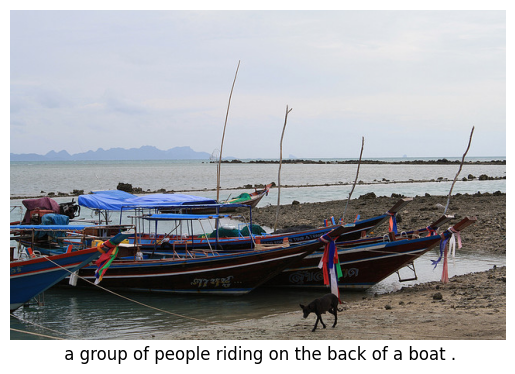

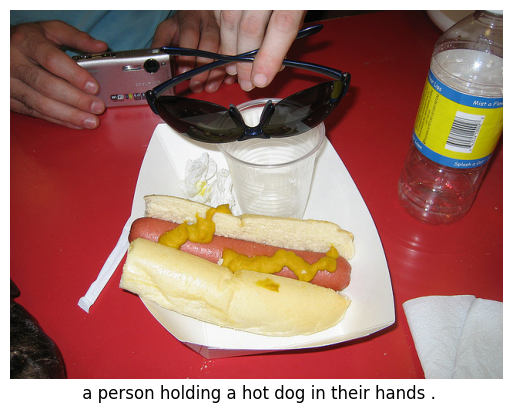

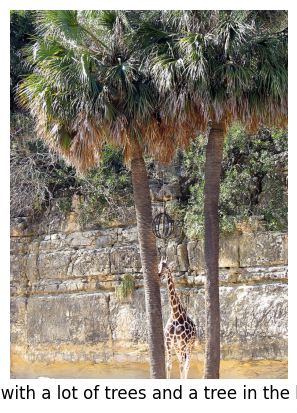

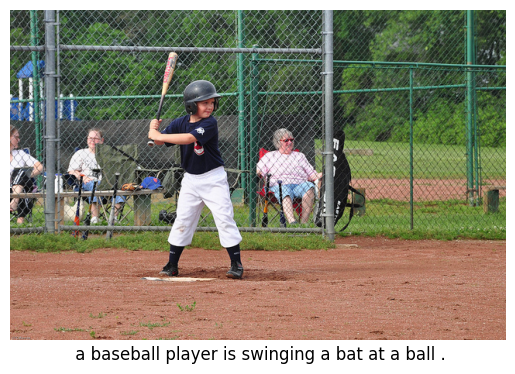

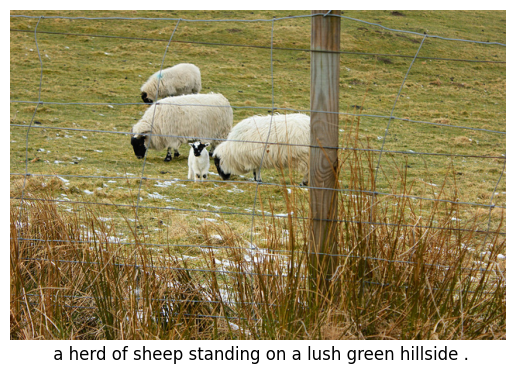

In [29]:
# Predict test dataset

for i in range(20):
    get_prediction(data_loader.dataset.vocab.idx2word, i=i)

## Predict New Images

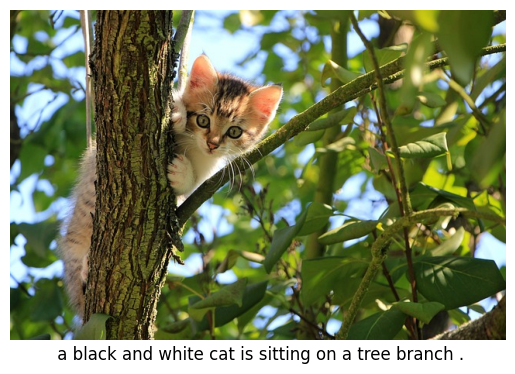

In [30]:
from PIL import Image
import torchvision.transforms as transforms

def load_vocab(vocab_path):
    with open(vocab_path, 'rb') as f:
        vocab = pickle.load(f)
    return vocab

def load_image(image_path, transform=None):
    """Load an image from file and apply transformations."""
    image = Image.open(image_path).convert('RGB')
    if transform:
        image = transform(image).unsqueeze(0)
    return image

def get_prediction_new(idx2word, image_path, save=False, i=0):
    orig_image = Image.open(image_path).convert('RGB')
    image = load_image(image_path, transform_test).to(device)

    # Generate features and predict
    features = encoder(image).unsqueeze(1)
    output = decoder.sample(features)
    sentence = clean_sentence(output, idx2word)

    # Display the image and prediction
    ax = plt.axes()
    # remove spines
    ax.spines["right"].set_visible(False)
    ax.spines["top"].set_visible(False)
    ax.spines["bottom"].set_visible(False)
    ax.spines["left"].set_visible(False)
    # Hide ticks
    ax.xaxis.set_major_locator(plt.NullLocator())
    ax.yaxis.set_major_locator(plt.NullLocator())

    plt.imshow(orig_image)
    plt.xlabel(sentence, fontsize=12)
    if save:
        plt.savefig(f"samples/sample_{i:03}.png", bbox_inches="tight")
    plt.show()


# Load vocab.pkl
vocab_path = "/kaggle/input/resnet-lstm-result/vocab.pkl" 
vocab = load_vocab(vocab_path)
idx2word = vocab.idx2word 

# Test sample image
image_path = "/kaggle/input/random-sample-image/image-110.jpg"
get_prediction_new(idx2word, image_path)

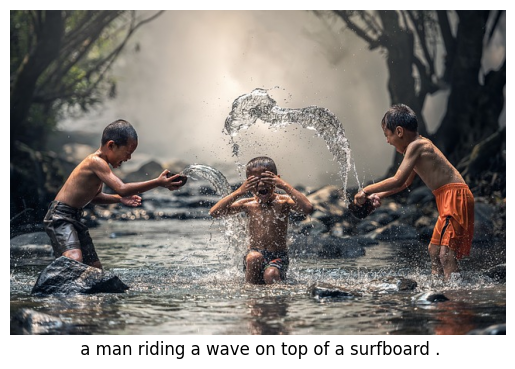

In [31]:
image_path = "/kaggle/input/random-sample-image/image-117.jpg"
get_prediction_new(idx2word, image_path)

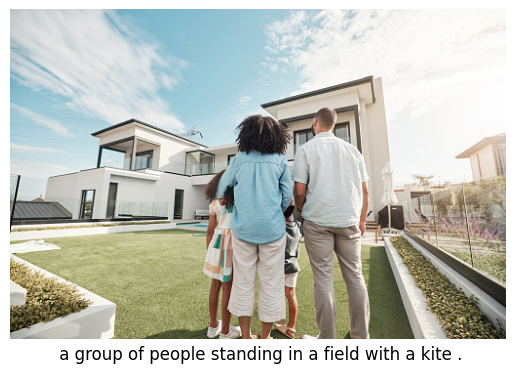

In [32]:
image_path = "/kaggle/input/random-sample-image/image-335.jpg"
get_prediction_new(idx2word, image_path)

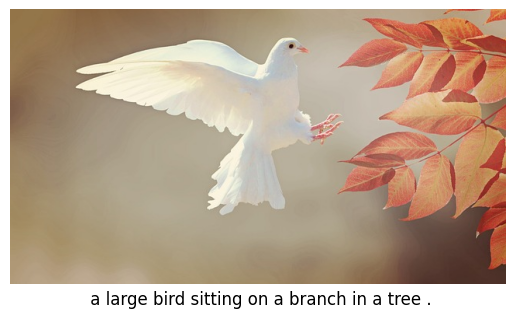

In [33]:
image_path = "/kaggle/input/random-sample-image/image-161.jpg"
get_prediction_new(idx2word, image_path)

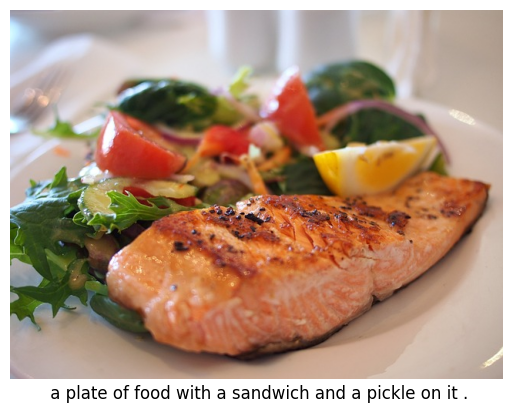

In [34]:
image_path = "/kaggle/input/random-sample-image/image-526.jpg"
get_prediction_new(idx2word, image_path)